# S07 T01: Tasca dades, probabilitats i estadístiques

Descripció

Aprèn a realitzar estadístiques amb Python

Objectius

- Calcular diferents estadístiques de les dades
- Representar gràficament diferents estadístiques de les dades

**Nivell 1**

- Exercici 1:

Agafa un conjunt de dades de tema esportiu que t'agradi i selecciona un atribut del conjunt de dades. Calcula la moda, la mediana, la desviació estàndard i la mitjana aritmètica.

In [1]:
import matplotlib.pyplot as plt
from plotly import express as px
from plotly import graph_objects as go
import seaborn as sns
import pandas as pd
import numpy as np
import statistics as stats

%matplotlib inline

**%matplotlib inline**:

With this backend, the output of plotting commands is displayed inline within frontends like the Jupyter notebook, directly below the code cell that produced it. The resulting plots will then also be stored in the notebook document.

In [2]:
all_seasons_df = pd.read_csv('../sampling/input/all_seasons.csv').drop('Unnamed: 0',axis=1)
all_seasons_df.head()

,player_name,team_abbreviation,age,player_height,player_weight,college,country,draft_year,draft_round,draft_number,...,pts,reb,ast,net_rating,oreb_pct,dreb_pct,usg_pct,ts_pct,ast_pct,season
0,Travis Knight,LAL,22.0,213.36,106.59412,Connecticut,USA,1996,1,29,...,4.8,4.5,0.5,6.2,0.127,0.182,0.142,0.536,0.052,1996-97
1,Matt Fish,MIA,27.0,210.82,106.59412,North Carolina-Wilmington,USA,1992,2,50,...,0.3,0.8,0.0,-15.1,0.143,0.267,0.265,0.333,0.000,1996-97
2,Matt Bullard,HOU,30.0,208.28,106.59412,Iowa,USA,Undrafted,Undrafted,Undrafted,...,4.5,1.6,0.9,0.9,0.016,0.115,0.151,0.535,0.099,1996-97
3,Marty Conlon,BOS,29.0,210.82,111.13004,Providence,USA,Undrafted,Undrafted,Undrafted,...,7.8,4.4,1.4,-9.0,0.083,0.152,0.167,0.542,0.101,1996-97
4,Martin Muursepp,DAL,22.0,205.74,106.59412,None,USA,1996,1,25,...,3.7,1.6,0.5,-14.5,0.109,0.118,0.233,0.482,0.114,1996-97


- Display the number of rows and columns in the database

In [3]:
all_seasons_df.shape

(11700, 21)

In [4]:
all_seasons_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11700 entries, 0 to 11699
Data columns (total 21 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   player_name        11700 non-null  object 
 1   team_abbreviation  11700 non-null  object 
 2   age                11700 non-null  float64
 3   player_height      11700 non-null  float64
 4   player_weight      11700 non-null  float64
 5   college            11700 non-null  object 
 6   country            11700 non-null  object 
 7   draft_year         11700 non-null  object 
 8   draft_round        11700 non-null  object 
 9   draft_number       11700 non-null  object 
 10  gp                 11700 non-null  int64  
 11  pts                11700 non-null  float64
 12  reb                11700 non-null  float64
 13  ast                11700 non-null  float64
 14  net_rating         11700 non-null  float64
 15  oreb_pct           11700 non-null  float64
 16  dreb_pct           117

In [5]:
season_wise_df = all_seasons_df.set_index(['player_name', 'season'])
season_wise_df.head()

,,team_abbreviation,age,player_height,player_weight,college,country,draft_year,draft_round,draft_number,gp,pts,reb,ast,net_rating,oreb_pct,dreb_pct,usg_pct,ts_pct,ast_pct
player_name,season,,,,,,,,,,,,,,,,,,,
Travis Knight,1996-97,LAL,22.0,213.36,106.59412,Connecticut,USA,1996,1,29,71,4.8,4.5,0.5,6.2,0.127,0.182,0.142,0.536,0.052
Matt Fish,1996-97,MIA,27.0,210.82,106.59412,North Carolina-Wilmington,USA,1992,2,50,6,0.3,0.8,0.0,-15.1,0.143,0.267,0.265,0.333,0.000
Matt Bullard,1996-97,HOU,30.0,208.28,106.59412,Iowa,USA,Undrafted,Undrafted,Undrafted,71,4.5,1.6,0.9,0.9,0.016,0.115,0.151,0.535,0.099
Marty Conlon,1996-97,BOS,29.0,210.82,111.13004,Providence,USA,Undrafted,Undrafted,Undrafted,74,7.8,4.4,1.4,-9.0,0.083,0.152,0.167,0.542,0.101
Martin Muursepp,1996-97,DAL,22.0,205.74,106.59412,None,USA,1996,1,25,42,3.7,1.6,0.5,-14.5,0.109,0.118,0.233,0.482,0.114


- Display Manu Ginobili' point averages for each of his seasons in the database:

In [6]:
season_wise_df.loc['Manu Ginobili',['pts']]

,pts
season,
2002-03,7.6
2003-04,12.8
2004-05,16.0
2005-06,15.1
2006-07,16.5
2007-08,19.5
2008-09,15.5
2009-10,16.5
2010-11,17.4


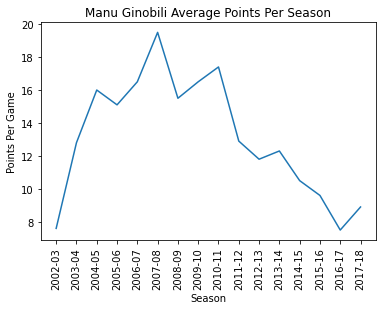

In [7]:
import matplotlib.pyplot as plt
#season_wise_df.loc['Manu Ginobili', ['pts']]
plt.plot(season_wise_df.loc['Manu Ginobili',['pts']])
plt.ylabel('Points Per Game')
plt.xticks(rotation=90)
plt.title('Manu Ginobili Average Points Per Season')
plt.xlabel('Season')
plt.show()

We will take in account the pts (average pts per game) to do the statistics calculation:

- Calculate the mode of pts per season for Manu Ginobili.

The mode is a statistical term that refers to the most frequently occurring number found in a set of numbers.

In [8]:
# Calculate the mode of  pts  per all seasons for Manu Ginobili:
print(f"Mode of pts: {round(season_wise_df.loc['Manu Ginobili'].pts.mode()[0], 2)}")

Mode of pts: 16.5


In [9]:
# Calculate the mode of "pts" per the first season for Manu Ginobili:
print(f"Mode of pts: {round(season_wise_df.loc[[('Manu Ginobili','2002-03')]].pts.mode()[0], 2)}")

Mode of pts: 7.6


In [10]:
# Calculate the mode of "pts" per the last season for Manu Ginobili:
print(f"Mode of pts: {round(season_wise_df.loc[[('Manu Ginobili','2017-18')]].pts.mode()[0], 2)}")

Mode of pts: 8.9


- What was the highest points per game that Manu Ginobili achieved in a single season?

In [11]:
all_seasons = season_wise_df.loc['Manu Ginobili']
all_seasons['pts'].max()

19.5

In [12]:
season_wise_df.loc['Manu Ginobili'].query("pts == 19.5")

,team_abbreviation,age,player_height,player_weight,college,country,draft_year,draft_round,draft_number,gp,pts,reb,ast,net_rating,oreb_pct,dreb_pct,usg_pct,ts_pct,ast_pct
season,,,,,,,,,,,,,,,,,,,
2007-08,SAS,30.0,198.12,92.98636,None,Argentina,1999,2,57,74,19.5,4.8,4.5,8.7,0.033,0.145,0.281,0.612,0.257


In [13]:
# Calculate the mode of "pts" per the best season for Manu Ginobili:
print(f"Mode of pts: {round(season_wise_df.loc[[('Manu Ginobili','2007-08')]].pts.mode()[0], 2)}")

Mode of pts: 19.5


- Calculate the Median of  pts  per all seasons for Manu Ginobili:

Median is a statistical measure that determines the middle value of a dataset listed in ascending order.

In [14]:
# Calculate the Median of "pts" per all seasons for Manu Ginobili:
print(f"Median of pts: {round(season_wise_df.loc['Manu Ginobili'].pts.median(), 2)}")

Median of pts: 12.85


- Calculate the std deviation  pts  per all seasons for Manu Ginobili:

The standard deviation is a statistic that measures the dispersion of a dataset relative to its mean.

In [15]:
# Calculate the std deviation of "pts" per all seasons for Manu Ginobili:
print(f"Standard deviation of pts: {round(season_wise_df.loc['Manu Ginobili'].pts.std(), 2)}")

Standard deviation of pts: 3.66


- Calculate the average pts per all seasons for Manu Ginobili:

In statistics, the mean is the average or most common value in a collection of numbers.

In [ ]:
# Calculate the average "pts" per all seasons for Manu Ginobili:
print(f"Mean of pts: {round(season_wise_df.loc['Manu Ginobili'].pts.mean(), 2)}")

- Exercici 2:

Continuant amb les dades de tema esportiu, selecciona dos atributs i calcula'n la seva correlació.

- Let's calculate the correlation between  reb  (rebounds per game) and  ast  (assists per game):

In [16]:
# Computing the correlation between "reb" and "ast":
print(f"Correlation between 'reb' and 'ast': {round(season_wise_df['reb'].corr(season_wise_df['ast']), 3)}")

Correlation between 'reb' and 'ast': 0.232


**Nivell 2**

- Exercici 3:

Continuant amb les dades de tema esportiu, calcula la correlació de tots els atributs entre sí i representa'ls en una matriu amb diferents colors d'intensitat.

In [17]:
# set undrafted to null
undrafted = season_wise_df[season_wise_df['draft_year']=='Undrafted']
season_wise_df['draft_year'] = season_wise_df['draft_year'].replace('Undrafted',np.NaN)
season_wise_df['draft_round'] = season_wise_df['draft_round'].replace('Undrafted',np.NaN)
season_wise_df['draft_number'] = season_wise_df['draft_number'].replace('Undrafted',np.NaN)
#season_wise_df.loc['Manu Ginobili', ['draft_year','draft_round','draft_number']]
season_wise_df.loc[:, ['draft_year','draft_round','draft_number']]

,,draft_year,draft_round,draft_number
player_name,season,,,
Travis Knight,1996-97,1996,1,29
Matt Fish,1996-97,1992,2,50
Matt Bullard,1996-97,NaN,NaN,NaN
Marty Conlon,1996-97,NaN,NaN,NaN
Martin Muursepp,1996-97,1996,1,25
...,...,...,...,...
Matthew Dellavedova,2020-21,NaN,NaN,NaN
Maurice Harkless,2020-21,2012,1,15
Max Strus,2020-21,NaN,NaN,NaN


In [18]:
cols_need = ['age','player_height','player_weight','gp','pts','reb','ast','net_rating','oreb_pct','dreb_pct','usg_pct','ts_pct','ast_pct']
cols_need = ['age','player_height','player_weight','gp','pts','reb','ast']
corr_anal_df = season_wise_df[cols_need]
corr_anal_df.head()

,,age,player_height,player_weight,gp,pts,reb,ast
player_name,season,,,,,,,
Travis Knight,1996-97,22.0,213.36,106.59412,71,4.8,4.5,0.5
Matt Fish,1996-97,27.0,210.82,106.59412,6,0.3,0.8,0.0
Matt Bullard,1996-97,30.0,208.28,106.59412,71,4.5,1.6,0.9
Marty Conlon,1996-97,29.0,210.82,111.13004,74,7.8,4.4,1.4
Martin Muursepp,1996-97,22.0,205.74,106.59412,42,3.7,1.6,0.5


In [19]:
# check for duplicate values: yes False => No duplicate values
corr_anal_df.duplicated().values.any()

False

In [20]:
# correlation matrix showing the correlation between features
corr_anal_df.corr()

,age,player_height,player_weight,gp,pts,reb,ast
age,1.000000,-0.011678,0.052119,0.049585,0.002873,0.031416,0.086853
player_height,-0.011678,1.000000,0.827301,-0.005329,-0.060524,0.422356,-0.457367
player_weight,0.052119,0.827301,1.000000,0.012496,-0.030655,0.437403,-0.387343
gp,0.049585,-0.005329,0.012496,1.000000,0.538367,0.468870,0.385596
pts,0.002873,-0.060524,-0.030655,0.538367,1.000000,0.622818,0.656564
reb,0.031416,0.422356,0.437403,0.468870,0.622818,1.000000,0.231678
ast,0.086853,-0.457367,-0.387343,0.385596,0.656564,0.231678,1.000000


array([[<AxesSubplot:xlabel='age', ylabel='age'>,
        <AxesSubplot:xlabel='player_height', ylabel='age'>,
        <AxesSubplot:xlabel='player_weight', ylabel='age'>,
        <AxesSubplot:xlabel='gp', ylabel='age'>,
        <AxesSubplot:xlabel='pts', ylabel='age'>,
        <AxesSubplot:xlabel='reb', ylabel='age'>,
        <AxesSubplot:xlabel='ast', ylabel='age'>],
       [<AxesSubplot:xlabel='age', ylabel='player_height'>,
        <AxesSubplot:xlabel='player_height', ylabel='player_height'>,
        <AxesSubplot:xlabel='player_weight', ylabel='player_height'>,
        <AxesSubplot:xlabel='gp', ylabel='player_height'>,
        <AxesSubplot:xlabel='pts', ylabel='player_height'>,
        <AxesSubplot:xlabel='reb', ylabel='player_height'>,
        <AxesSubplot:xlabel='ast', ylabel='player_height'>],
       [<AxesSubplot:xlabel='age', ylabel='player_weight'>,
        <AxesSubplot:xlabel='player_height', ylabel='player_weight'>,
        <AxesSubplot:xlabel='player_weight', ylabel='player_

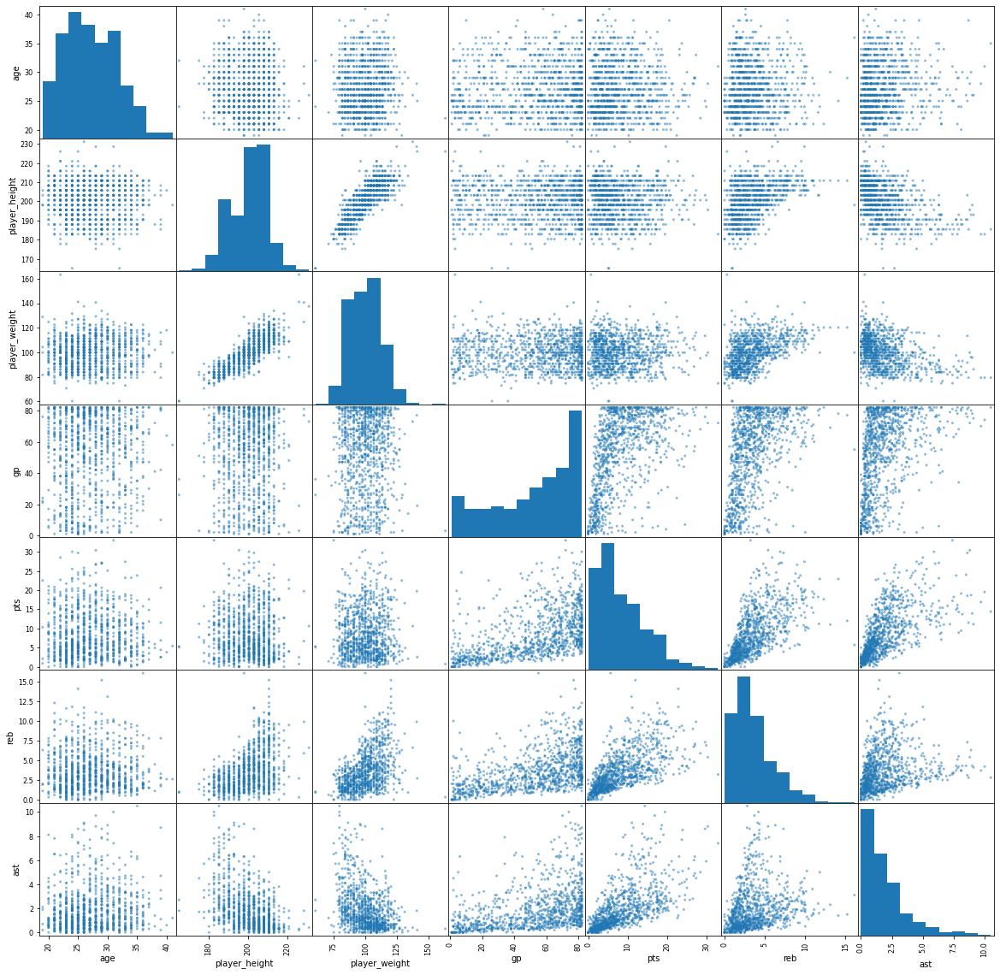

In [21]:
# visualizing relation between features
pd.plotting.scatter_matrix(corr_anal_df.sample(1000), figsize = (20,20), alpha = 0.5)

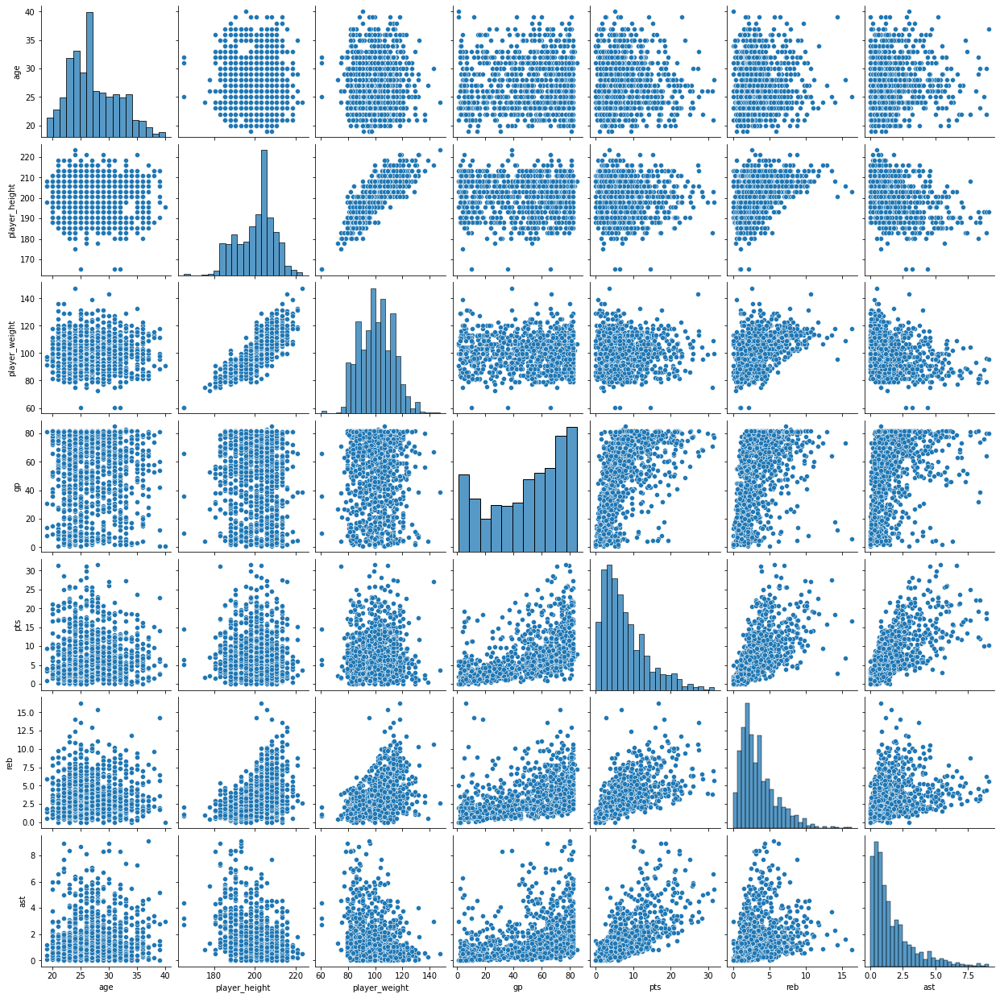

In [22]:
# for a better visualization we use seaborn
sns.pairplot(corr_anal_df.sample(1000))

In [23]:
df = corr_anal_df.corr()
df

,age,player_height,player_weight,gp,pts,reb,ast
age,1.000000,-0.011678,0.052119,0.049585,0.002873,0.031416,0.086853
player_height,-0.011678,1.000000,0.827301,-0.005329,-0.060524,0.422356,-0.457367
player_weight,0.052119,0.827301,1.000000,0.012496,-0.030655,0.437403,-0.387343
gp,0.049585,-0.005329,0.012496,1.000000,0.538367,0.468870,0.385596
pts,0.002873,-0.060524,-0.030655,0.538367,1.000000,0.622818,0.656564
reb,0.031416,0.422356,0.437403,0.468870,0.622818,1.000000,0.231678
ast,0.086853,-0.457367,-0.387343,0.385596,0.656564,0.231678,1.000000


In [24]:
corr_anal_df.corr().info()

<class 'pandas.core.frame.DataFrame'>
Index: 7 entries, age to ast
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   age            7 non-null      float64
 1   player_height  7 non-null      float64
 2   player_weight  7 non-null      float64
 3   gp             7 non-null      float64
 4   pts            7 non-null      float64
 5   reb            7 non-null      float64
 6   ast            7 non-null      float64
dtypes: float64(7)
memory usage: 748.0+ bytes


In [25]:
corr_anal_df.corr().describe()

,age,player_height,player_weight,gp,pts,reb,ast
count,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000
mean,0.173024,0.244966,0.273046,0.349941,0.389920,0.459220,0.216569
std,0.366126,0.525320,0.501285,0.366014,0.418163,0.304392,0.527871
min,-0.011678,-0.457367,-0.387343,-0.005329,-0.060524,0.031416,-0.457367
25%,0.017145,-0.036101,-0.009080,0.031041,-0.013891,0.327017,-0.150245
50%,0.049585,-0.005329,0.052119,0.385596,0.538367,0.437403,0.231678
75%,0.069486,0.624829,0.632352,0.503618,0.639691,0.545844,0.521080
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [26]:
fig = px.density_heatmap(corr_anal_df, x = 'age', y = 'gp', marginal_x = 'histogram', marginal_y = 'histogram')
fig.show()

- property DataFrame.empty

True if DataFrame is entirely empty (no items), meaning any of the axes are of length 0.

**Returns**: bool

If DataFrame is empty, return True, if not return False.

In [27]:
print('empty:', corr_anal_df.empty)

empty: False


- DataFrame.bool()
  
Return the bool of a single element Series or DataFrame. This must be a boolean scalar value, either True or False. It will raise a ValueError if the Series or DataFrame does not have exactly 1 element, or that element is not boolean (integer values 0 and 1 will also raise an exception).

**Returns**: bool

The value in the Series or DataFrame.

In [28]:
print('bool pandas.Series:', pd.Series([True]).bool())
print('bool pandas.Series:', pd.Series([False]).bool())
print('bool pandas.Dataframe:', pd.DataFrame({'col': [True]}).bool())
print('bool pandas.Dataframe:', pd.DataFrame({'col': [False]}).bool())

bool pandas.Series: True
bool pandas.Series: False
bool pandas.Dataframe: True
bool pandas.Dataframe: False


- Series.item()
  
Function return the first element of the underlying data of the given series object as a python scalar.

**Returns**: scalar

The first element of %(klass)s.

**Raises**: ValueError

If the data is not length-1.

Function return the first element of the underlying data of the given series object as a python scalar.

**Note** : This function can only convert an array of size 1 to a Python scalar

In [29]:
print('item pandas.Series:', pd.Series([248]).item())

item pandas.Series: 248


In [30]:
# Creating the Series
sr = pd.Series([248])
   
# Create the Index
index_ = ['Coca Cola']
   
# set the index
sr.index = index_
   
# Print the series
print(sr)
 
# return a scalar
result = sr.item()
   
# Print the result
print(result) 

Coca Cola    248
dtype: int64
248


- DataFrame.any(axis=0, bool_only=None, skipna=True, level=None, **kwargs)

 Return whether any element is True, potentially over an axis.  

 Returns False unless there is at least one element within a series or along a Dataframe axis that is True or equivalent (e.g. non-zero or non-empty).  

 Return whether any element is True, potentially over an axis.

 Returns False unless there is at least one element within a series or along a Dataframe axis that is True or equivalent (e.g. non-zero or non-empty).  

 | Parameters: | axis:  | {0 or ‘index’, 1 or ‘columns’, None}, default 0                                                   |  
 |:------------|:-------------------|:--------------------------------------------------------------------------------------|  
 |             |                    | Indicate which axis or axes should be reduced.                                        |  
 |             |                    | * 0 / ‘index’ : reduce the index, return a Series whose index is the original column labels.|  
 |             |                    | * 1 / ‘columns’ : reduce the columns, return a Series whose index is the original index.|  
 |             |                    | * **None++ : reduce all axes, return a scalar.|  
 |             | **bool_only**:     | **bool, default None**                                                                |  
 |             |                    | Include only boolean columns. If None, will attempt to use everything, then use only boolean data. Not implemented for Series.|  
 |             | **skipna**:        | **bool, default True**                                                                |  
 |             |                    | Exclude NA/null values. If the entire row/column is NA and skipna is True, then the result will be False, as for an empty row/column. If skipna is False, then NA are treated as True, because these are not equal to zero.|  
 |             | **level**:         | **int or level name, default None                                                     |  
 |             |                    | If the axis is a MultiIndex (hierarchical), count along a particular level, collapsing into a Series.|  
 |             | **\\*\\*kwargs**:    | **any, default None**                                                                 |  
 |             |                    | Additional keywords have no effect but might be accepted for compatibility with NumPy.|  
 | **Returns**:| **Series or DataFrame**|                                                                                   |  
 |             |                    | If level is specified, then, DataFrame is returned; otherwise, Series is returned.    |


In [31]:
print('any:', corr_anal_df.any(1).head(5))

any: player_name      season 
Travis Knight    1996-97    True
Matt Fish        1996-97    True
Matt Bullard     1996-97    True
Marty Conlon     1996-97    True
Martin Muursepp  1996-97    True
dtype: bool


- DataFrame.all(axis=0, bool_only=None, skipna=True, level=None, **kwargs)

Return whether all elements are True, potentially over an axis.

Returns True unless there at least one element within a series or along a Dataframe axis that is False or equivalent (e.g. zero or empty).

| Parameters: | axis:              | {0 or ‘index’, 1 or ‘columns’, None}, default 0                                       |
|:------------|:-------------------|:--------------------------------------------------------------------------------------|
|             |                    | Indicate which axis or axes should be reduced.                                        |
|             |                    | * 0 / ‘index’ : reduce the index, return a Series whose index is the original column labels.|
|             |                    | * 1 / ‘columns’ : reduce the columns, return a Series whose index is the original index.|
|             |                    | * **None**: reduce all axes, return a scalar.|
|             | **bool_only**:     | **bool, default None**                                                                |
|             |                    | Include only boolean columns. If None, will attempt to use everything, then use only boolean data. Not implemented for Series.|
|             | **skipna**:        | **bool, default True**                                                                |
|             |                    | Exclude NA/null values. If the entire row/column is NA and skipna is True, then the result will be False, as for an empty row/column. If skipna is False, then NA are treated as True, because these are not equal to zero.|
|             | **level**:         | **int or level name, default None                                                     |
|             |                    | If the axis is a MultiIndex (hierarchical), count along a particular level, collapsing into a Series.|
|             | **\*\*kwargs**:    | **any, default None**                                                                 |
|             |                    | Additional keywords have no effect but might be accepted for compatibility with NumPy.|
| **Returns**:| **Series or DataFrame**|                                                                                   |
|             |                    | If level is specified, then, DataFrame is returned; otherwise, Series is returned.    |

In [32]:
print('all:', corr_anal_df.all(1))

all: player_name          season 
Travis Knight        1996-97     True
Matt Fish            1996-97    False
Matt Bullard         1996-97     True
Marty Conlon         1996-97     True
Martin Muursepp      1996-97     True
                                ...  
Matthew Dellavedova  2020-21     True
Maurice Harkless     2020-21     True
Max Strus            2020-21     True
Marcus Morris Sr.    2020-21     True
Aaron Gordon         2020-21     True
Length: 11700, dtype: bool


In [33]:
# using mean normalization:
normalized_df = (df - df.mean()) / df.std()

In [34]:
# using min-max normalization:
normalized_df = ( df - df.min()) / (df.max() - df.min())

In [36]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaled_values = scaler.fit_transform(df)
df.loc[:,:] = scaled_values

<AxesSubplot:>

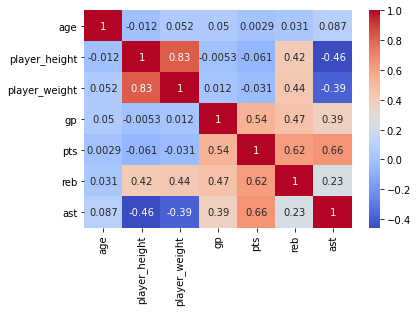

In [37]:
sns.heatmap(corr_anal_df.corr(), annot = True, cmap = 'coolwarm')

**Nivell 3**

- Exercici 4:

Continuant amb les dades de tema esportiu, selecciona un atribut i calcula la mitjana geomètrica i la mitjana harmònica.

- Calculate the geometric mean of \"pts\" per all seasons for Manu Ginobili:

The geometric mean is calculated by raising the product of a series of numbers to the inverse of the total length of the series. The geometric mean is most useful when the numbers in the series are not independent of each other or if the numbers tend to have large fluctuations. The geometric mean is also appropriate if the values have different units.

In [38]:
# Calculate the geometric mean of \"pts\" per all seasons for Manu Ginobili:
print(f"Geometric mean of pts: {round(stats.geometric_mean(season_wise_df.loc['Manu Ginobili'].pts.dropna()), 2)}")

Geometric mean of pts: 12.64


- Calculate the harmonic mean of "pts" per all seasons for Manu Ginobili:

The harmonic mean is a type of numerical mean. It is calculated by dividing the number of observations by the reciprocal of each number in the series. Thus, the harmonic mean is the reciprocal of the arithmetic mean of the reciprocals. The harmonic mean is appropriate if the data values are quotients of two variables with different measures, called rates.


In [39]:
# Calculate the harmonic mean of "pts" per all seasons for Manu Ginobili:
print(f"Harmonic mean of pts: {round(stats.harmonic_mean(season_wise_df.loc['Manu Ginobili'].pts.dropna()), 2)}")

Harmonic mean of pts: 12.11
